Use Data Set from https://www.kaggle.com/shivam2811/unsupervised-animal-dataset

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib import image
import os

Function for putting images into array

In [2]:
def image_array(folder, num_folders, num_images):
    train_set = np.empty((num_images*num_folders, 512, 512))
    original_images = np.empty((num_images*num_folders, 512, 512, 3))
    total_images = 0
    for i in folder:
        for j in range(num_images):
            if(os.path.isfile(i+os.listdir(i)[j])):
                if((i+os.listdir(i)[j]).lower().endswith(('.jpg'))):
                    original_images[total_images] = image.imread(i+os.listdir(i)[j])
                    total_images = total_images+1
    return original_images

Functions for reshaping images into (262144d) vector and binarising

In [3]:
def transform(original_images, num_folders, num_images):
    train_set = original_images.reshape(num_images*num_folders,-1)/255
    train_set[train_set < 0.5] = 0
    train_set[train_set > 0.5] = 1 
    return train_set

Functions for MLE

In [4]:
def mle(train_set):
    return ((np.sum(train_set, axis=0))/train_set.shape[0]).reshape(512,512,3)

Functions for K-means

In [5]:
def calcSqDistances(X, Kmus):
    return ((-2 * X.dot (Kmus.T) + np.sum(np.multiply(Kmus,Kmus), axis=1).T).T + np.sum(np.multiply(X,X), axis=1)).T

In [6]:
def determineRnk(sqDmat):
    m = np.argmin(sqDmat,axis=1)
    return np.eye(sqDmat.shape[1])[m]

In [7]:
def recalcMus(X, Rnk):
    return (np.divide(X.T.dot(Rnk), np.sum(Rnk, axis=0))) .T

In [8]:
def runKMeans(K, train_set):
    #Get number of data points
    N = train_set.shape[0]
    #Get the 'length' of each data point. These are 512*512 images
    D = train_set.shape[1]
    #Allocate space for the K mu vectors
    Kmus = np.zeros((K,D))
    #Generate random indices, to initialize cluster centers
    rand_inds = np.random.permutation(N)
    Kmus = train_set[rand_inds[0:K],:]
   
    maxiters = 1000

    for iter in range(maxiters):
      sqDmat = calcSqDistances(train_set, Kmus)
      Rnk = determineRnk(sqDmat)
      KmusOld = Kmus
      Kmus = recalcMus(train_set, Rnk)

      if np.sum(np.abs(KmusOld.reshape((-1, 1)) - Kmus.reshape((-1, 1)))) < 1e-6:
            #print(iter)
            break

    return Kmus, Rnk

Function for running all other functions

In [9]:
def run(folder, num_images, K):
    num_folders = len(folder)
    original_images = image_array(folder, num_folders, num_images)
    train_set = transform(original_images, num_folders, num_images)
    MLE = mle(train_set)
    Kmus, Rnk = runKMeans(K, train_set)
    Kmus_2, Rnk_2 = runKMeans(2, train_set)
    return train_set, original_images, MLE, Kmus, Kmus_2, Rnk, Rnk_2

Functions for displaying results

In [10]:
def display_mle (MLE):
    plt.imshow(MLE, cmap = plt.cm.binary)
    plt.title("MLE")

In [11]:
def get_cluster_plot(Kmus, K): 
    '''
    : get a plot of what different clusters represent
    : takes as input the cluster location matrix
    '''
    fig,axs = plt.subplots(int(K/5),5, figsize = (20,15))#(15,9))
    fig.suptitle("K-Means "+str(K))
    for i in range(len(Kmus)):
        cluster = Kmus[i].reshape(512,512,3)
        axs[i//5][i%5].imshow(cluster)#, cmap = plt.cm.binary)
        axs[i//5][i%5].set_title(f'Cluster {i + 1}')
    

In [12]:
def get_cluster_plot_2(Kmus): 
    '''
    : get a plot of what different clusters represent
    : takes as input the cluster location matrix
    '''
    fig,axs = plt.subplots(1,2)
    fig.suptitle("K-Means 2")
    for i in range(len(Kmus)):
        cluster = Kmus[i].reshape(512,512,3)
        axs[i].imshow(cluster)
        axs[i].set_title(f'Cluster {i + 1}')

In [13]:
def scatter_centroids(train_set, Kmus):
    x = [i for i in range(train_set.shape[1])]
    plt.scatter(x,Kmus[0], color = 'red',alpha=0.2,s=70)
    plt.scatter(x,Kmus[1] , color = 'blue',alpha=0.2,s=50)

In [14]:
def images_in_cluster(train_set, original_images, Rnk, cluster):
    original_images = original_images.astype(int)
    num_images = 0
    for i in range(train_set.shape[0]):
        if (Rnk[i,cluster]==1): 
            num_images = num_images+1    
    fig,axs = plt.subplots(int(num_images/10)+1,10, figsize = (10,6))
    fig.suptitle(cluster)
    if num_images<10:
        for i in range(10):
            axs[i].axis('off')
    else:
        for i in range(int(num_images/10)+1):
            for j in range(10):
                axs[i][j].axis('off')
    j=0
    for i in range(train_set.shape[0]):
        if (Rnk[i,cluster]==1): 
            if num_images>9:
                axs[j//10][j%10].imshow(original_images[i][:,:])
                axs[j//10][j%10].axis('off')
            else:
                axs[j].imshow(original_images[i][:,:])
                axs[j].axis('off')
            j=j+1
        
    return num_images

In [15]:
def isprime(num):
    for n in range(2,int(num**0.5)+1):
        if num%n==0:
            return False
    return True

In [16]:
def show_indices(train_set, original_images, Rnk):
    show=[]
    for i in range(Rnk.shape[1]):
        num_in_cluster = images_in_cluster(train_set, original_images, Rnk, i)
        show.append(i)
    return show

Using Part of the Original Images

In [17]:
train_set, original_images, MLE, Kmus, Kmus_2, Rnk, Rnk_2 = run(['./Animal Images Dataset/'], 198, 20)

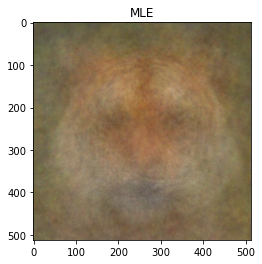

In [18]:
display_mle (MLE)

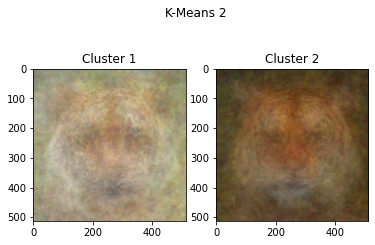

In [19]:
get_cluster_plot_2(Kmus_2)

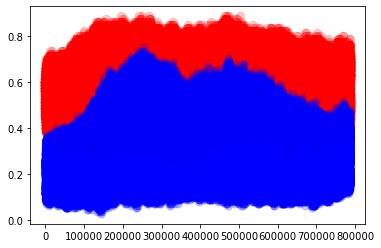

In [20]:
scatter_centroids(train_set, Kmus_2)

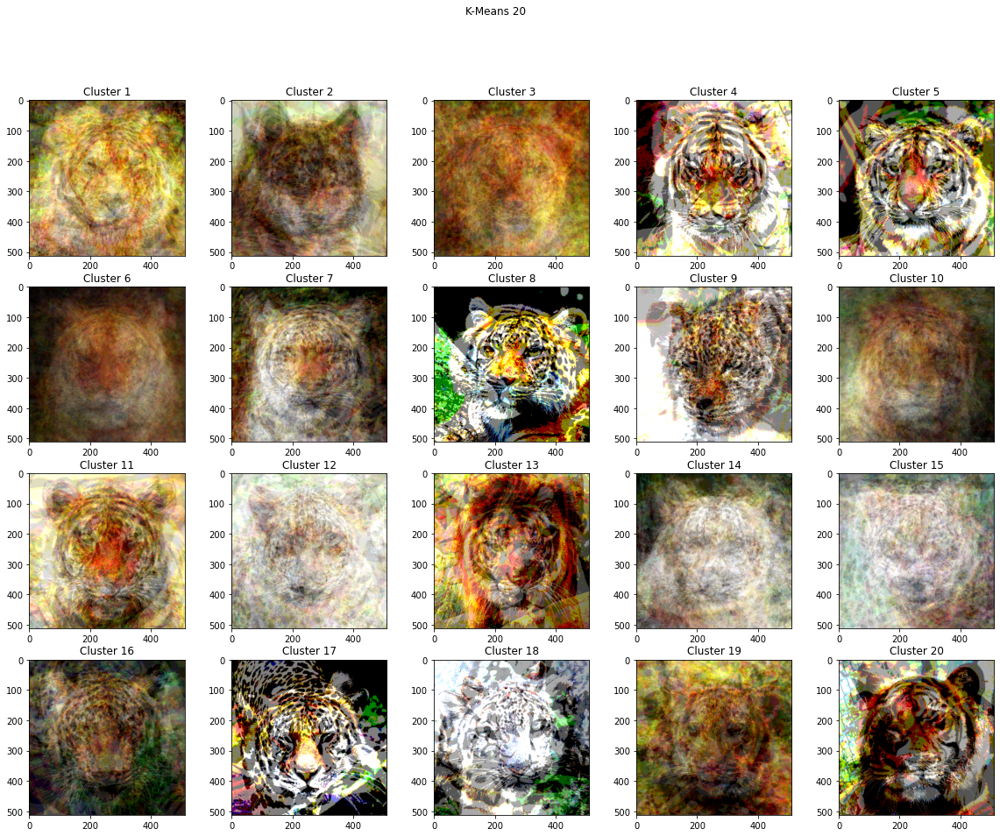

In [21]:
get_cluster_plot(Kmus, 20)

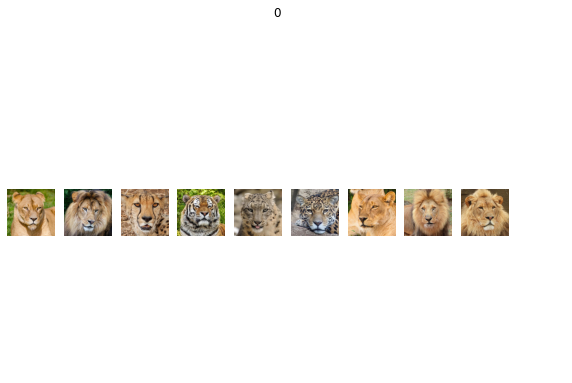

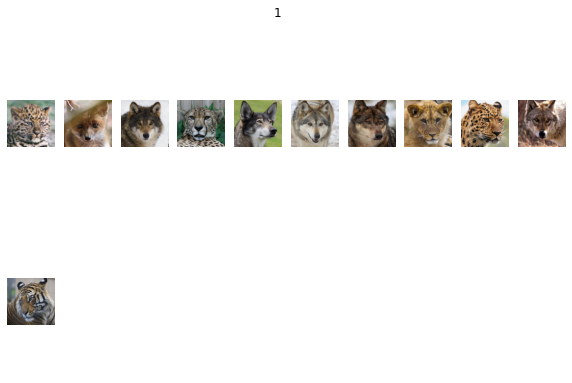

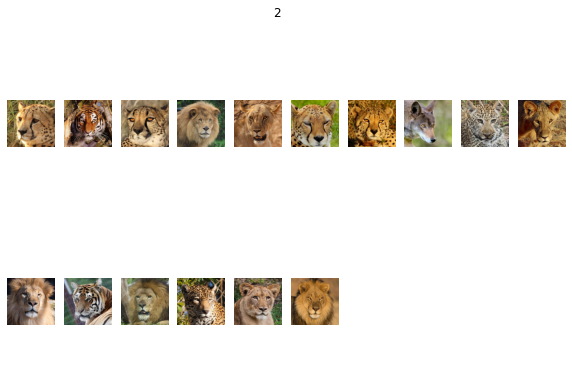

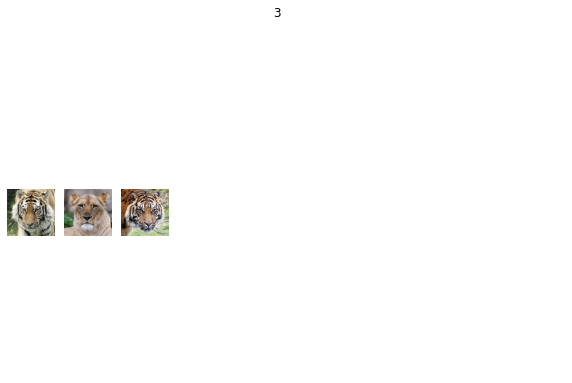

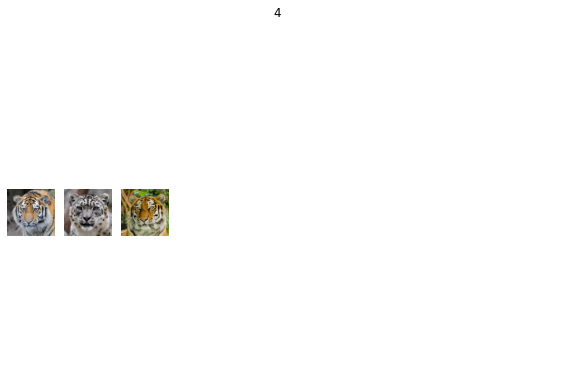

...

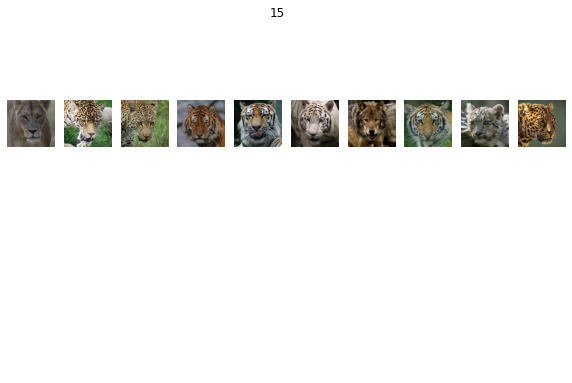

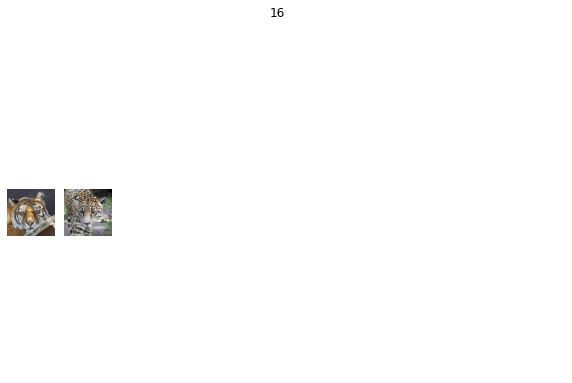

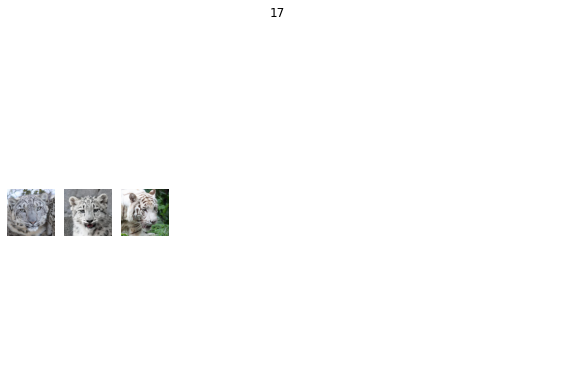

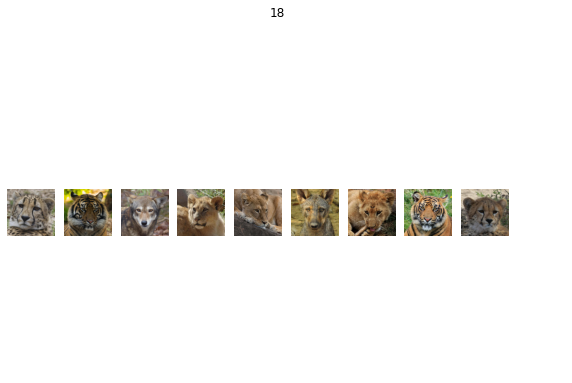

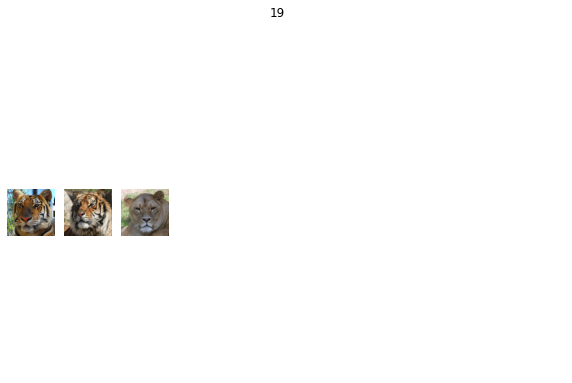

In [22]:
show = show_indices(train_set, original_images, Rnk)

Using Pre-processed Images so animals face the same way (flipped horizontally if necessary)

In [23]:
train_set, original_images, MLE, Kmus, Kmus_2, Rnk, Rnk_2 = run(['./Animal Images Flip/'], 198, 20)

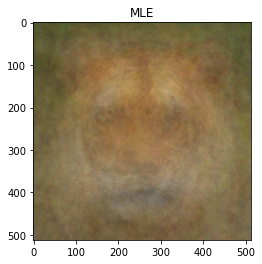

In [24]:
display_mle (MLE)

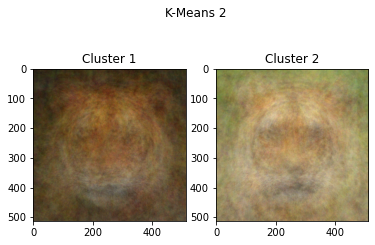

In [25]:
get_cluster_plot_2(Kmus_2)

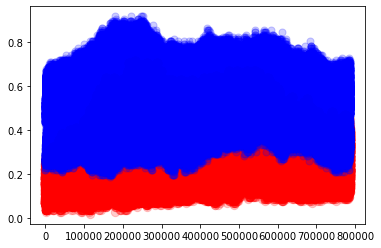

In [26]:
scatter_centroids(train_set, Kmus_2)

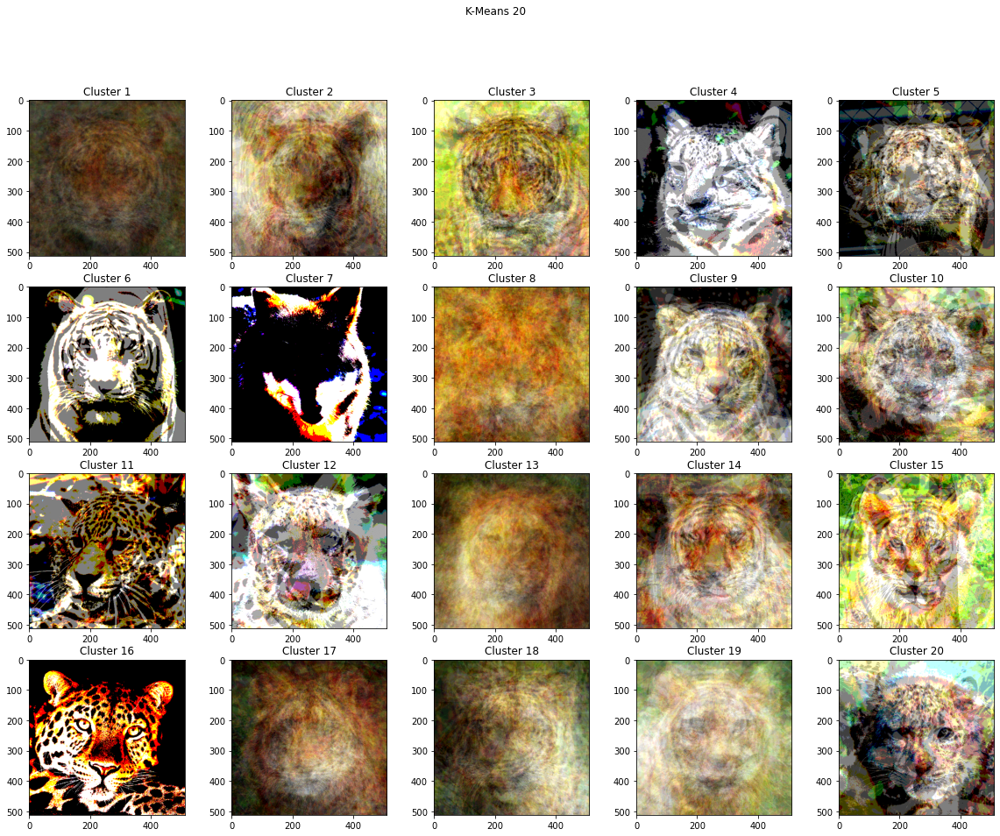

In [27]:
get_cluster_plot(Kmus, 20)

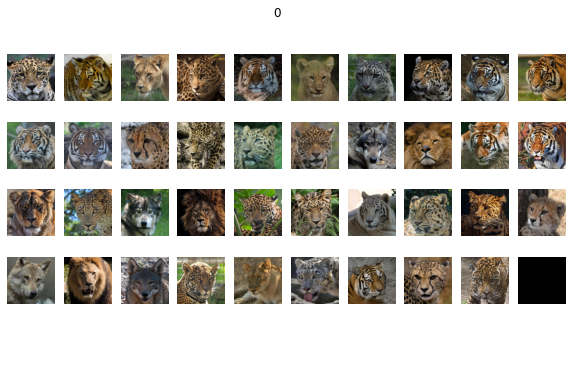

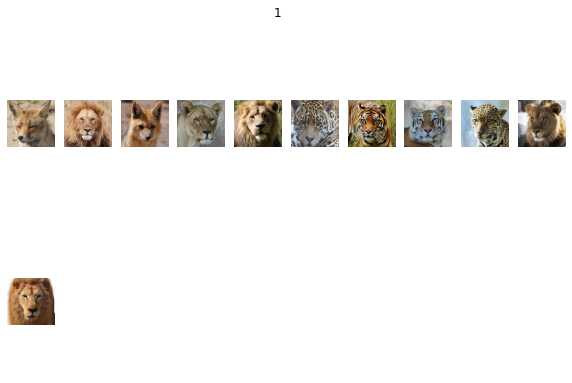

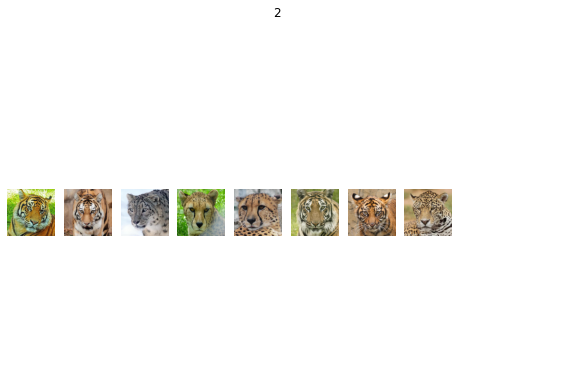

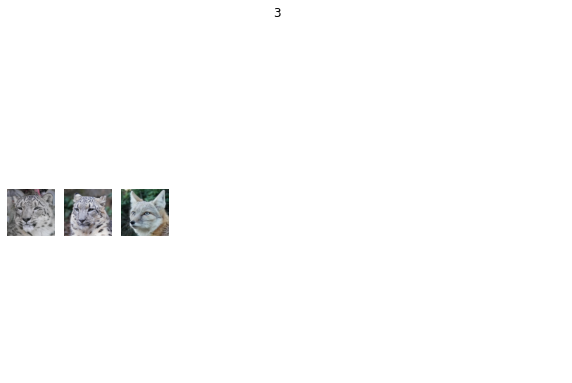

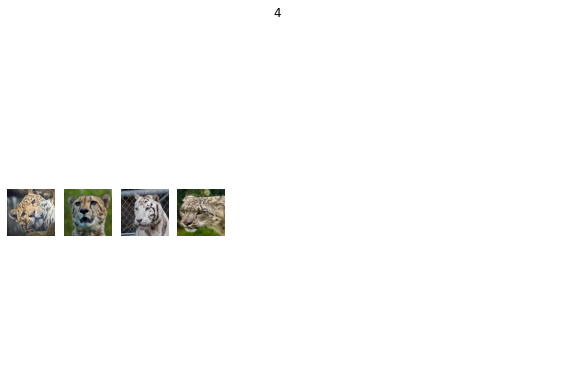

...

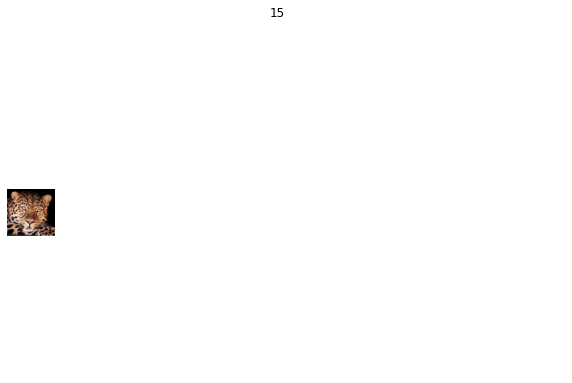

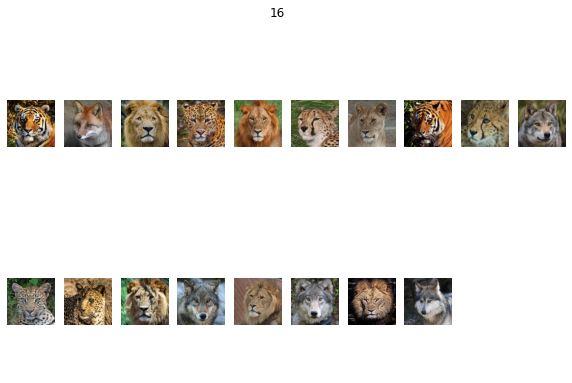

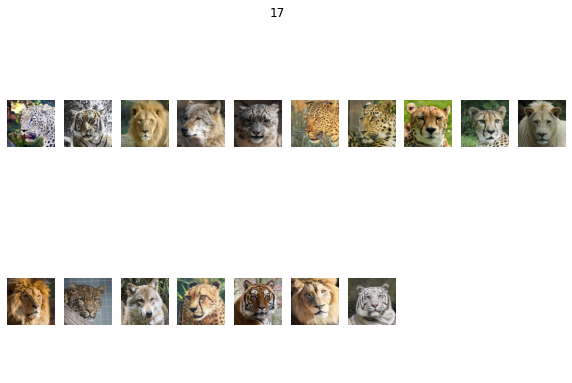

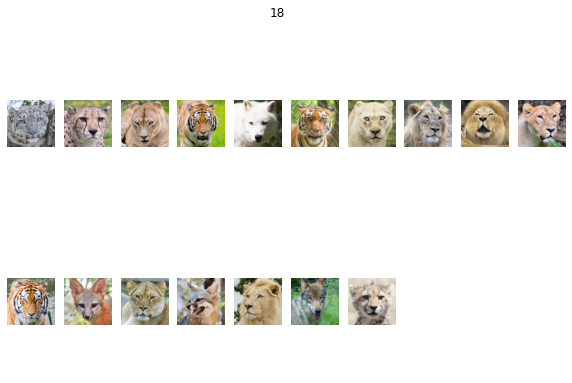

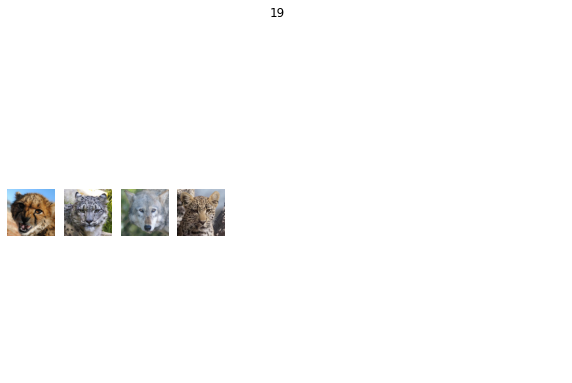

In [28]:
show = show_indices(train_set, original_images, Rnk)

Using Pre-processed Images so only include animals facing forward

In [29]:
train_set, original_images, MLE, Kmus, Kmus_2, Rnk, Rnk_2 = run(['./Animal Images Remove/'], 198, 20)

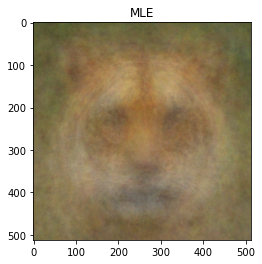

In [30]:
display_mle (MLE)

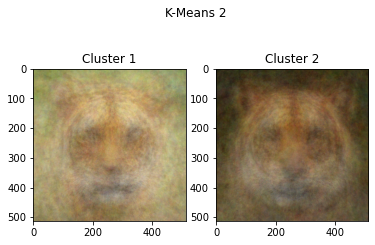

In [31]:
get_cluster_plot_2(Kmus_2)

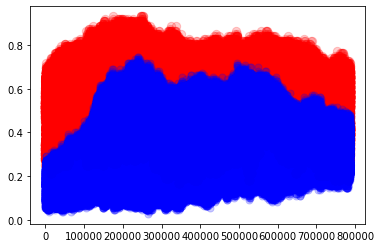

In [32]:
scatter_centroids(train_set, Kmus_2)

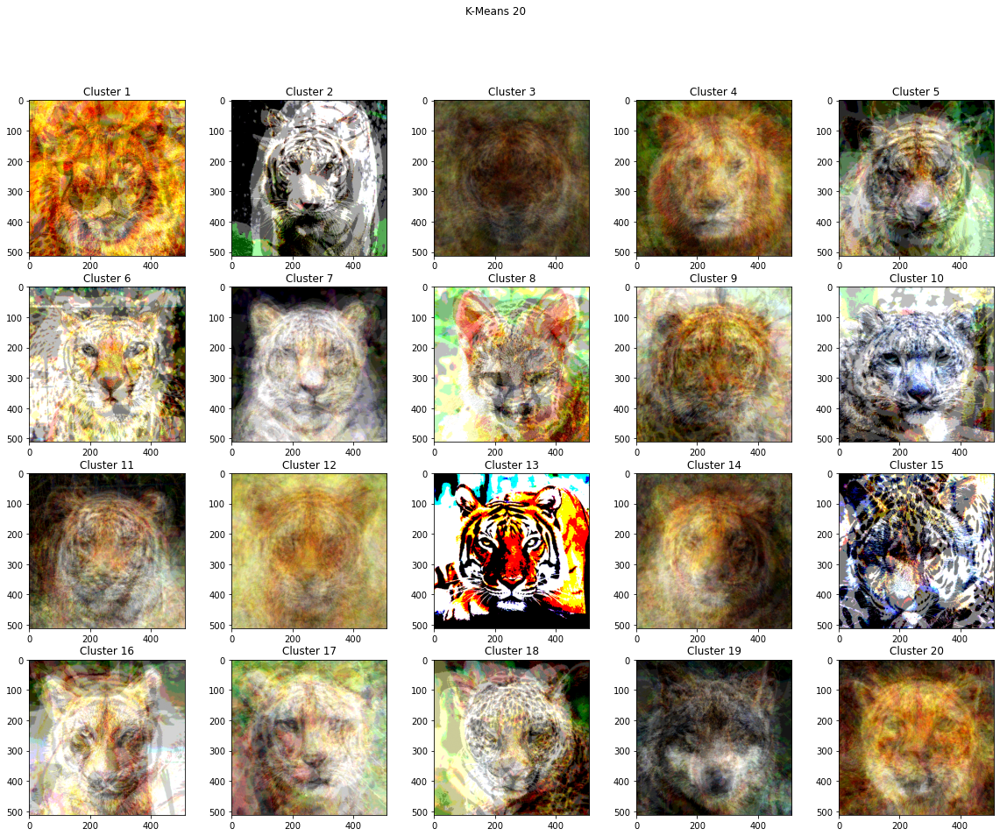

In [33]:
get_cluster_plot(Kmus, 20)

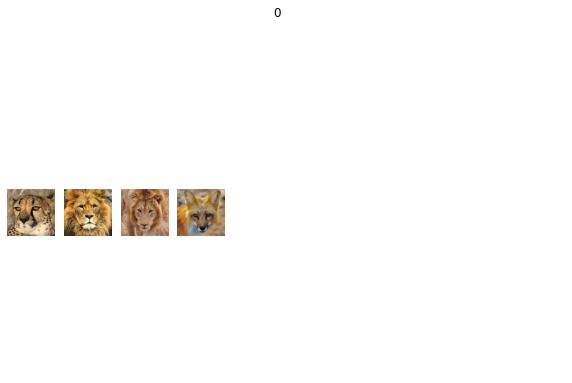

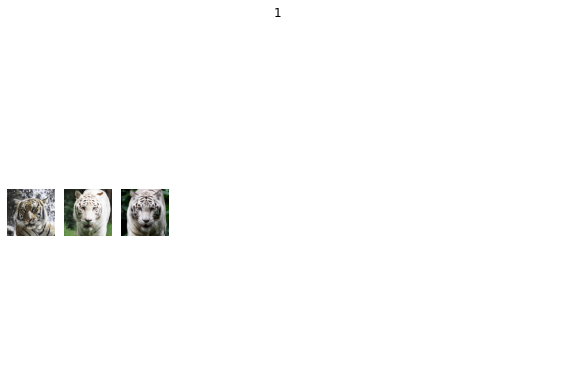

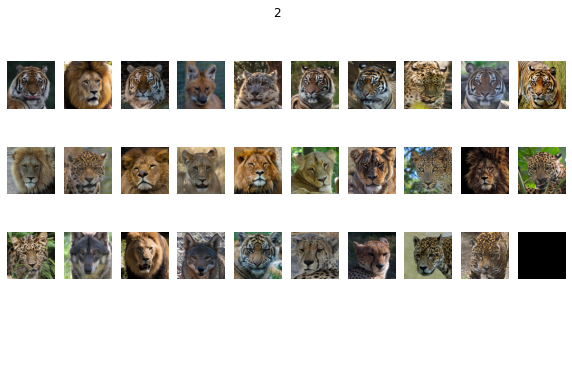

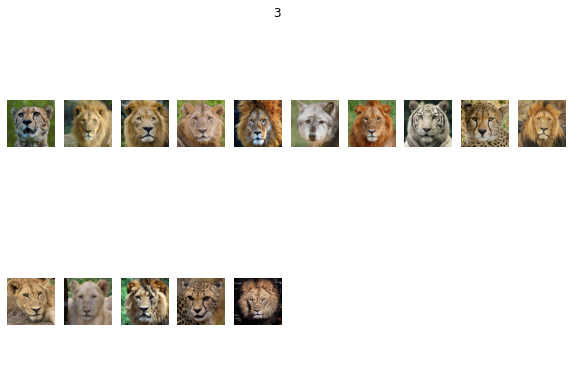

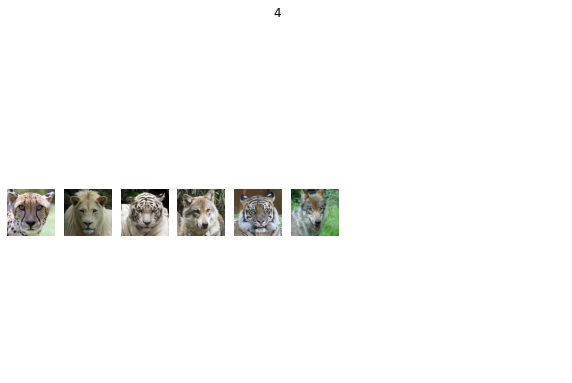

...

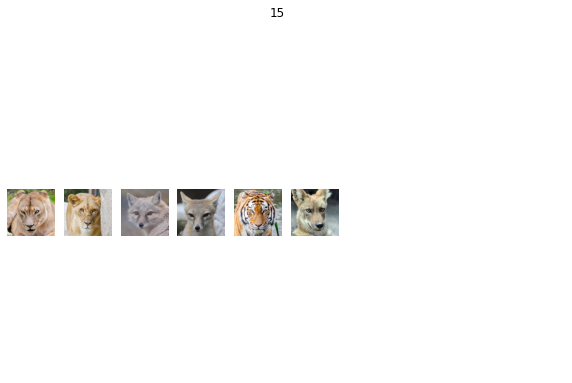

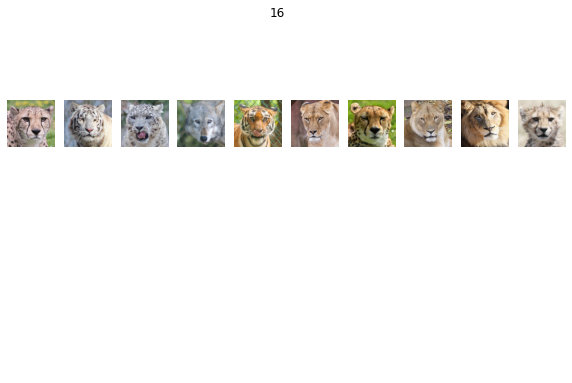

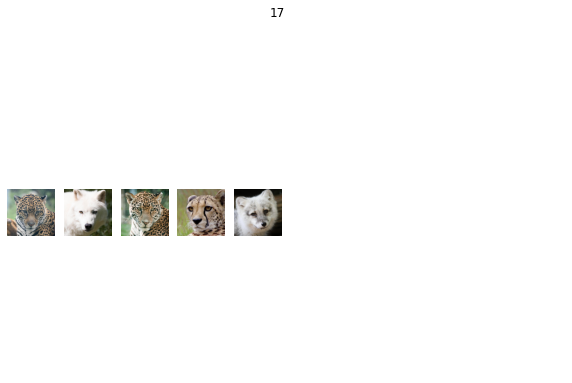

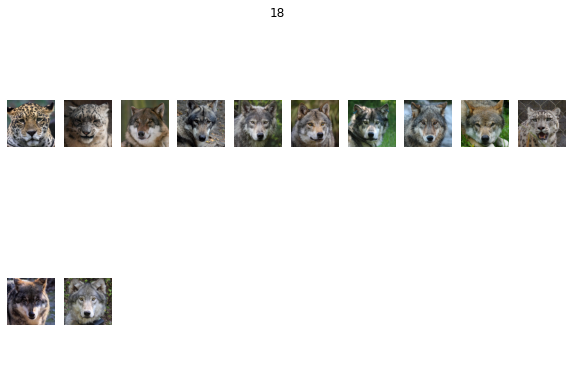

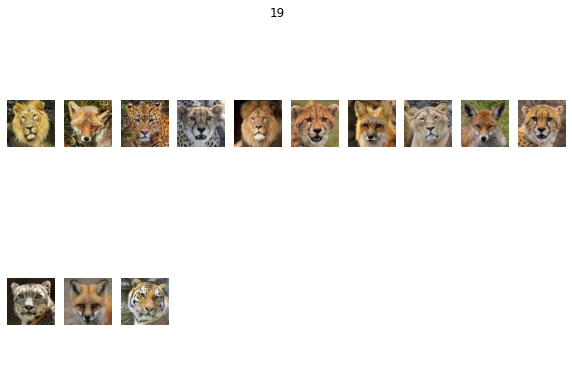

In [34]:
show = show_indices(train_set, original_images, Rnk)

Using face images of cats, dogs, and wild animals from https://www.kaggle.com/andrewmvd/animal-faces (train folder)

In [35]:
train_set, original_images, MLE, Kmus, Kmus_2, Rnk, Rnk_2 = run(['./More Animals/train/cat/', './More Animals/train/dog/', './More Animals/train/wild/'], 66, 20)

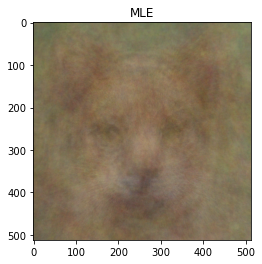

In [36]:
display_mle (MLE)

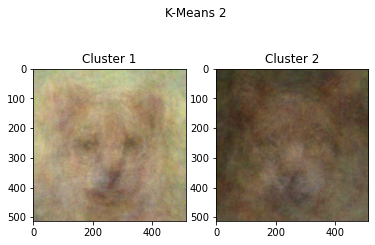

In [37]:
get_cluster_plot_2(Kmus_2)

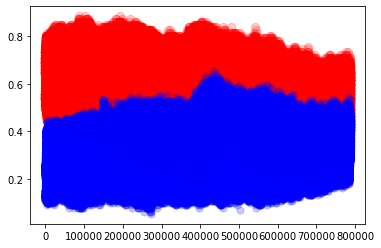

In [38]:
scatter_centroids(train_set, Kmus_2)

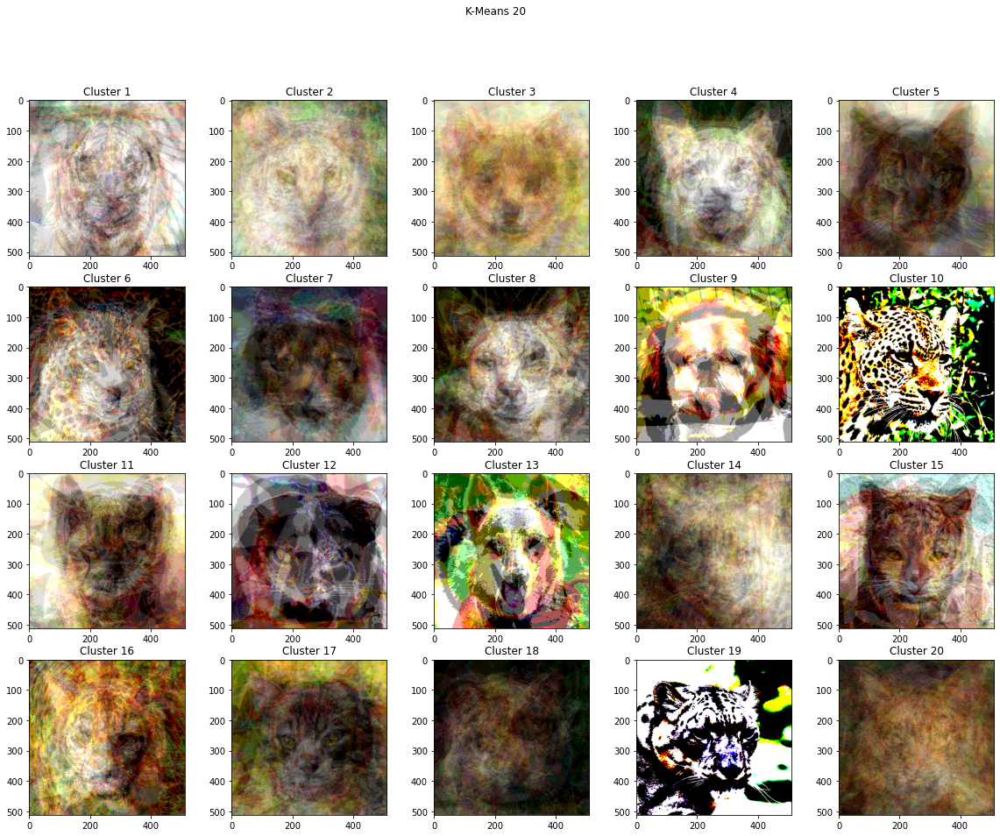

In [39]:
get_cluster_plot(Kmus, 20)

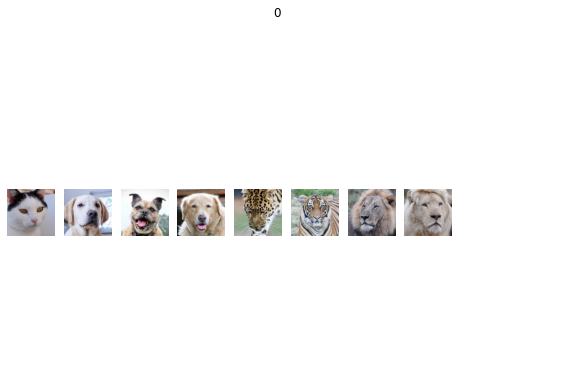

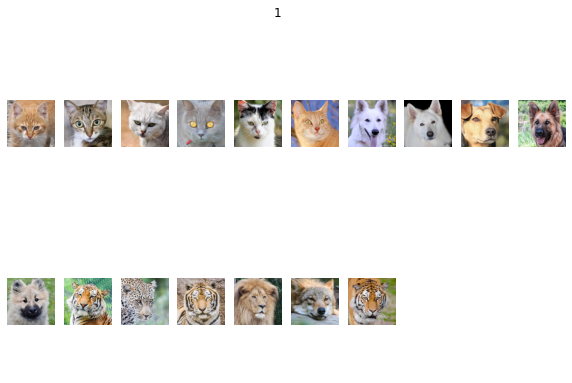

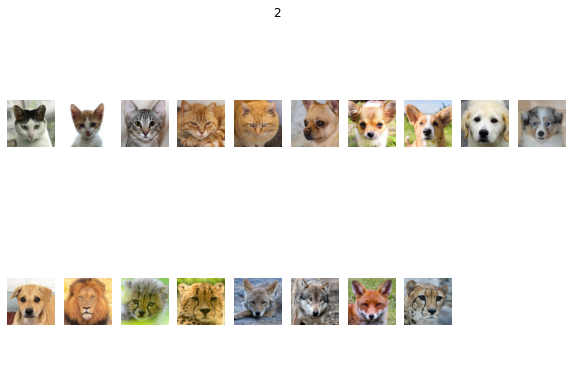

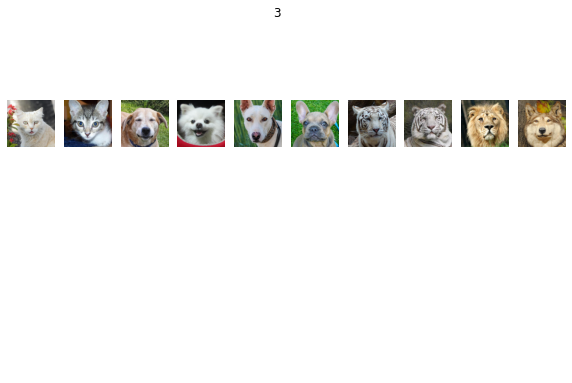

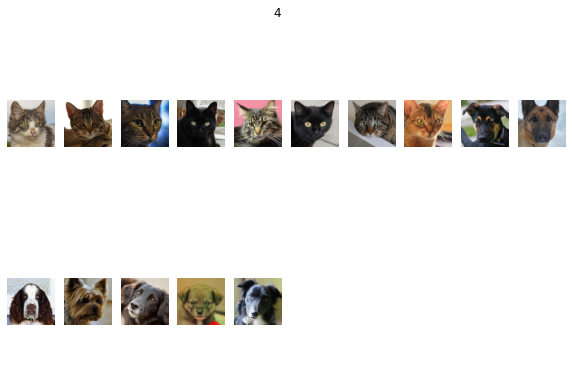

...

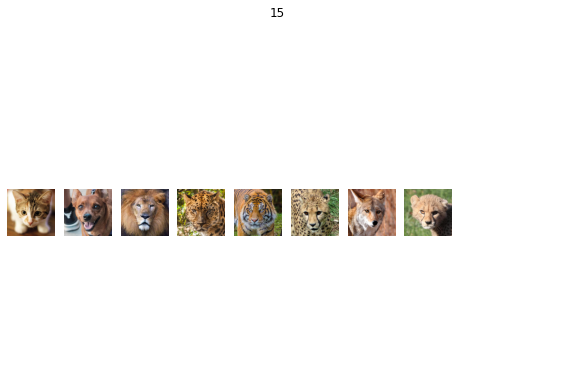

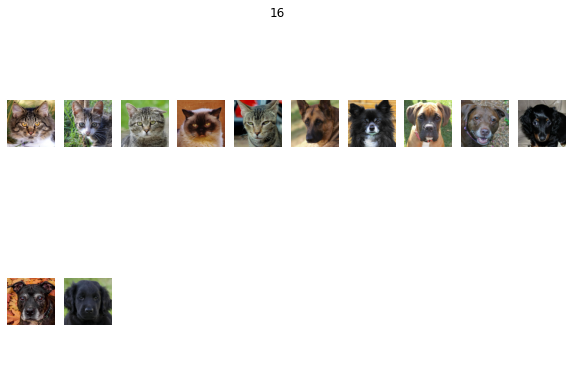

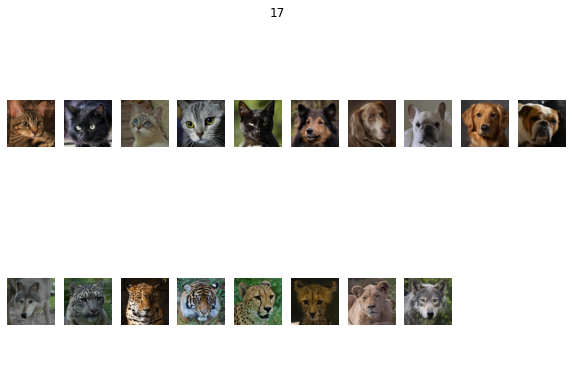

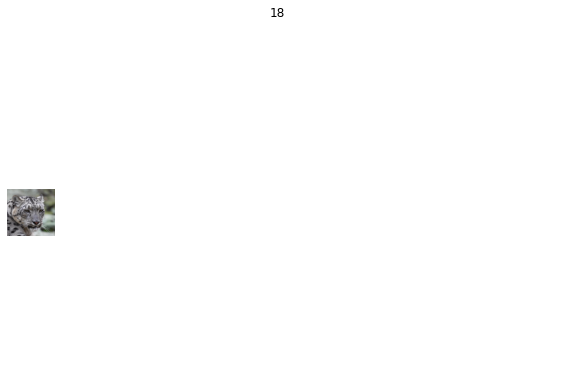

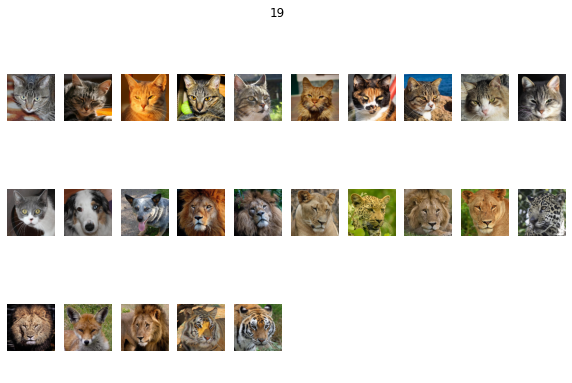

In [40]:
show = show_indices(train_set, original_images, Rnk)

Using All the Original Images

In [41]:
#train_set, MLE, Kmus, Kmus_2, Rnk, Rnk_2 = run(['./Animal Images Dataset/'], 4737, 20)